# Portland, aggregated
This notebook documents how the City of Portland creates a set of polygons to describe Portland in terms of residential and employment use.

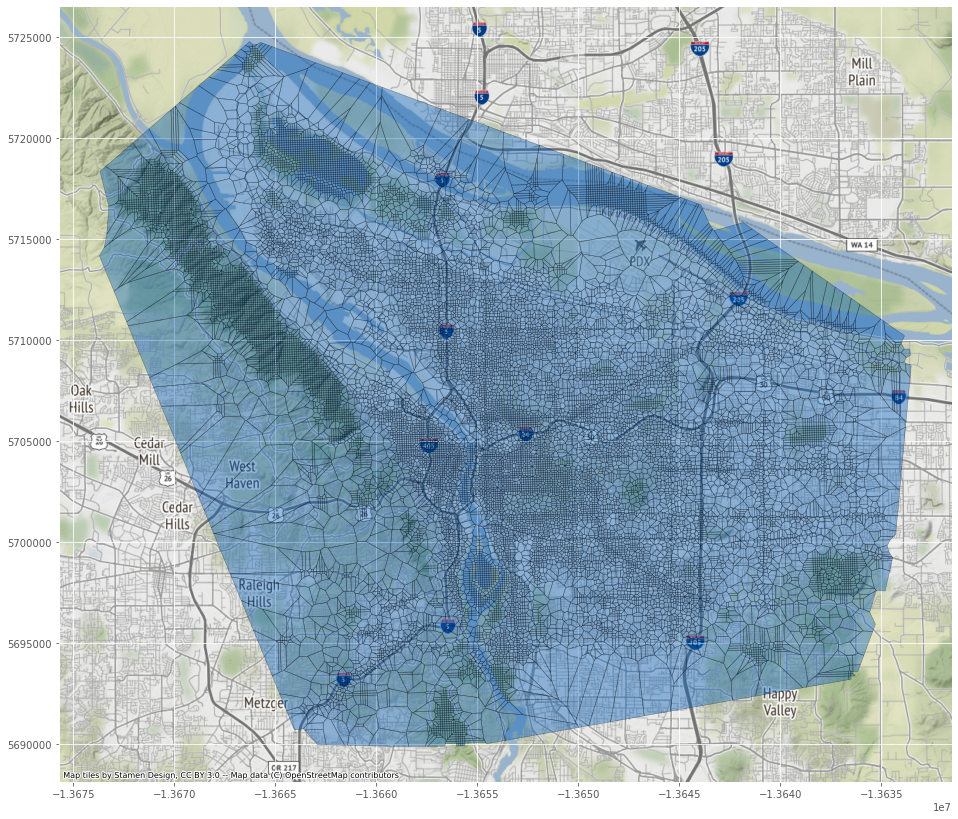

In [20]:
ax = cells.plot(color='#005cb9', edgecolor='black', alpha=0.4)
ctx.add_basemap(ax)

This imports some plotting defaults for this notebook

In [1]:
import contextily as ctx
import geopandas as gpd
import hashlib
import matplotlib
import matplotlib.pyplot as plt
import numpy as np
import pandas as pd
import shapely

from shapely.geometry import Polygon

plt.style.use('ggplot')
matplotlib.rcParams['figure.figsize'] = (16, 20)

## Retrieving a mesh of Portland

We'll start with a mesh of Portland.  The mesh is a series of 250 foot by 250 foot squares.  The squares also have information about number of housing units and employment numbers.  The mesh was created by Portland's [Bureau of Planning and Sustainability](https://portland.gov/bps) and provides the basis for the rest of the approach to aggregation documented below.

/opt/conda/lib/python3.7/site-packages/pyproj/crs/crs.py:55: FutureWarning: '+init=<authority>:<code>' syntax is deprecated. '<authority>:<code>' is the preferred initialization method. When making the change, be mindful of axis order changes: https://pyproj4.github.io/pyproj/stable/gotchas.html#axis-order-changes-in-proj-6
  return _prepare_from_string(" ".join(pjargs))


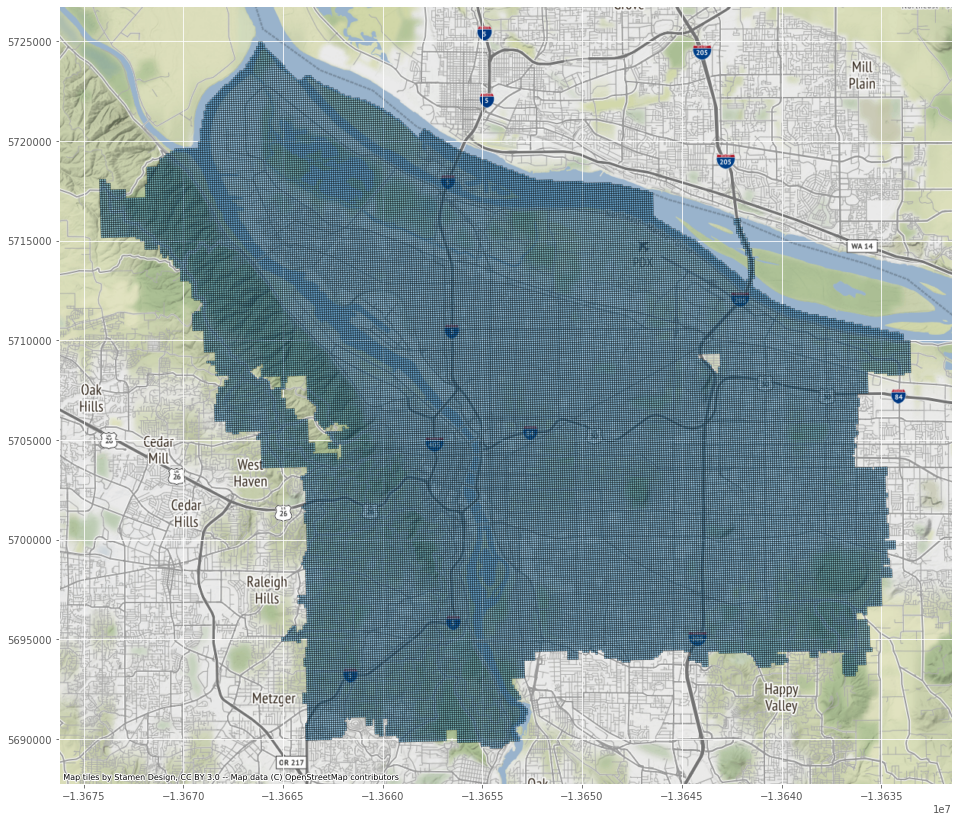

In [2]:
mesh = gpd.read_file('../.data/citymesh_v2webMerc.geojson')
mesh = mesh.to_crs('epsg:3857')
ax = mesh.plot(alpha=0.5, edgecolor='k')
ctx.add_basemap(ax)

## Filtering the mesh by attached number of housing units

Let's look at what columns we have to filter on

In [3]:
mesh.columns

Index(['Grid_ID', 'employers', 'sum_avgemp', 'hh_units', 'geometry'], dtype='object')

The hh_units counts the number of housing units existing in each polygon.  We'll use this to filter down the mesh to a level that allows for anonymized locations.  We'll start with 5 or more housing units and see what that looks like.

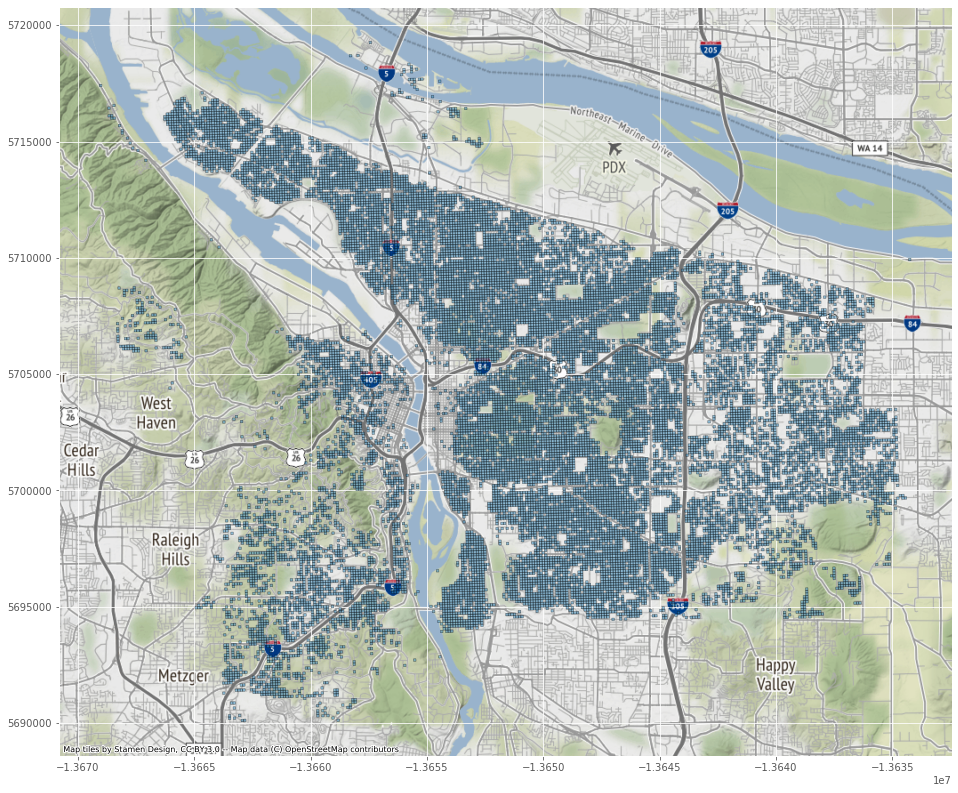

In [4]:
ax = mesh[mesh['hh_units'] > 4].plot(alpha=0.5, edgecolor='k')
ctx.add_basemap(ax)

This is still rather dense in most areas, and wouldn't allow for more residential areas specifically in inner neighborhoods to have much in the way of anonymized location data.  Also of note is that central city mostly disappears using this filter.  W'll deal with that in the next section.  For now, we'll bump the housing unit requirement to 10 or more units.

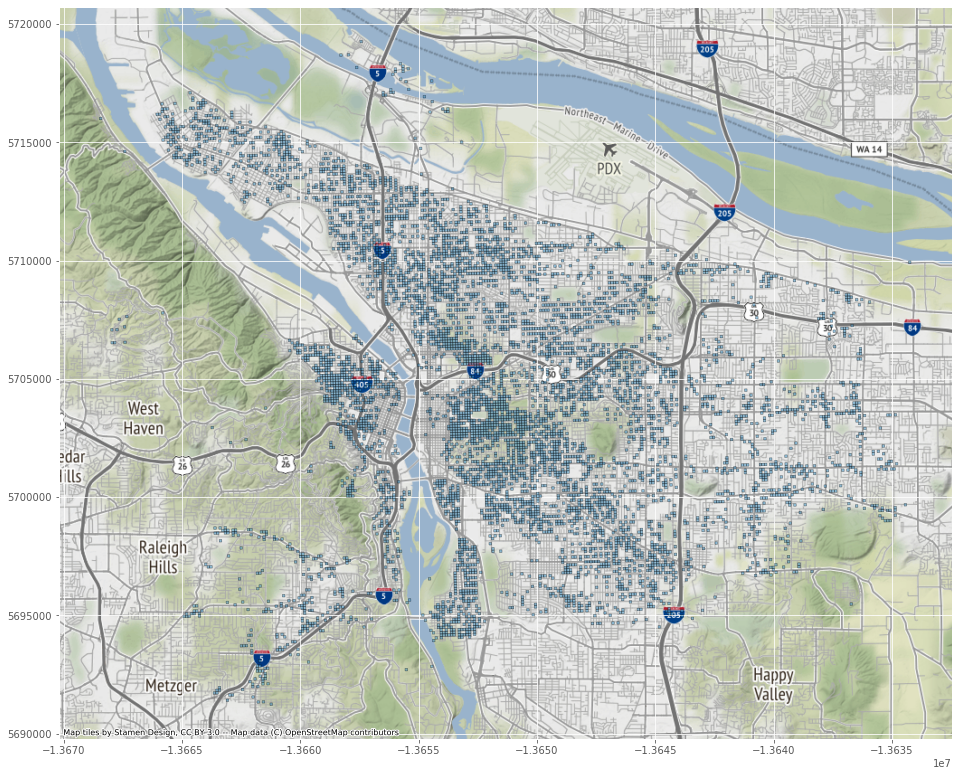

In [5]:
ax = mesh[mesh['hh_units'] > 9].plot(alpha=0.5, edgecolor='k')
ctx.add_basemap(ax)

## Filtering the mesh by employment numbers
This mesh dataset also includes employment information, which we'll use to add back in areas that while not residential, are instead places with enough anonymity due to the number of employees in the mesh.  We'll use the same requirement of the sum of the average employees as we do with housing, namely 10 or more.

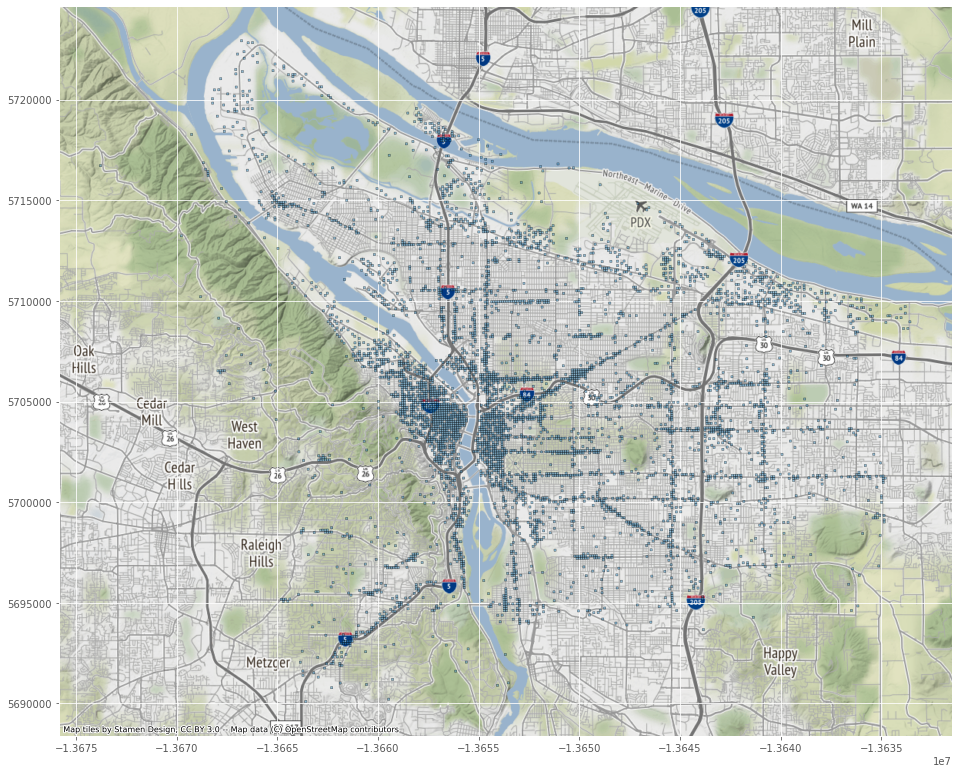

In [6]:
ax = mesh[mesh['sum_avgemp'] > 9].plot(alpha=0.5, edgecolor='k')
ctx.add_basemap(ax)

We can see that major streets and central city have reappeared in the mesh.  Let's save this work into a DataFrame.

In [7]:
keep = mesh[(mesh.hh_units > 9) | (mesh.sum_avgemp > 9)]

## Filtering the mesh by zoning codes
While we've filtered to anonymize the mesh by places where people are located in large enough number, there are still areas like parks where no one lives or works, that we want to keep higher resolution to help enforce parking and riding restrictions.  We'll start with Portland's open dataset of zoning areas.

In [8]:
zoning = gpd.read_file('https://opendata.arcgis.com/datasets/6b26f2ccb71d431f9ce8f34fd8ec1558_16.geojson')
zoning = zoning.to_crs(epsg='3857')

Let's look more at what the zoning codes mean to help us pick the right filters

In [9]:
groups = zoning.groupby(['CMP', 'CMP_DESC'])
for n,v in groups:
    print(n)

('CX', 'Central Commercial')
('EX', 'Central Employment')
('IC', 'Institutional Campus')
('IS', 'Industrial Sanctuary')
('MD-C', 'Multi-Dwelling - Corridor')
('MD-N', 'Multi-Dwelling - Neighborhood')
('MD-U', 'Multi-Dwelling - Urban Center')
('MDP', 'Manufactured Dwelling Park')
('ME', 'Mixed Employment')
('MU-C', 'Mixed Use - Civic Corridor')
('MU-D', 'Mixed Use - Dispersed')
('MU-N', 'Mixed Use - Neighborhood')
('MU-U', 'Mixed Use - Urban Center')
('OS', 'Open Space')
('R10', 'Single - Dwelling 10,000')
('R2.5', 'Single - Dwelling 2,500')
('R20', 'Single - Dwelling 20,000')
('R5', 'Single - Dwelling 5,000')
('R7', 'Single - Dwelling 7,000')
('RF', 'Single - Dwelling Residential Farm / Forest')
('RX', 'Central Residential')


We'll keep those mesh areas that are within an 'Open Space' designation.   This is so, in case there is a scooter we want removed from a park, we can more easily find it rather than having to search an entire park for it.

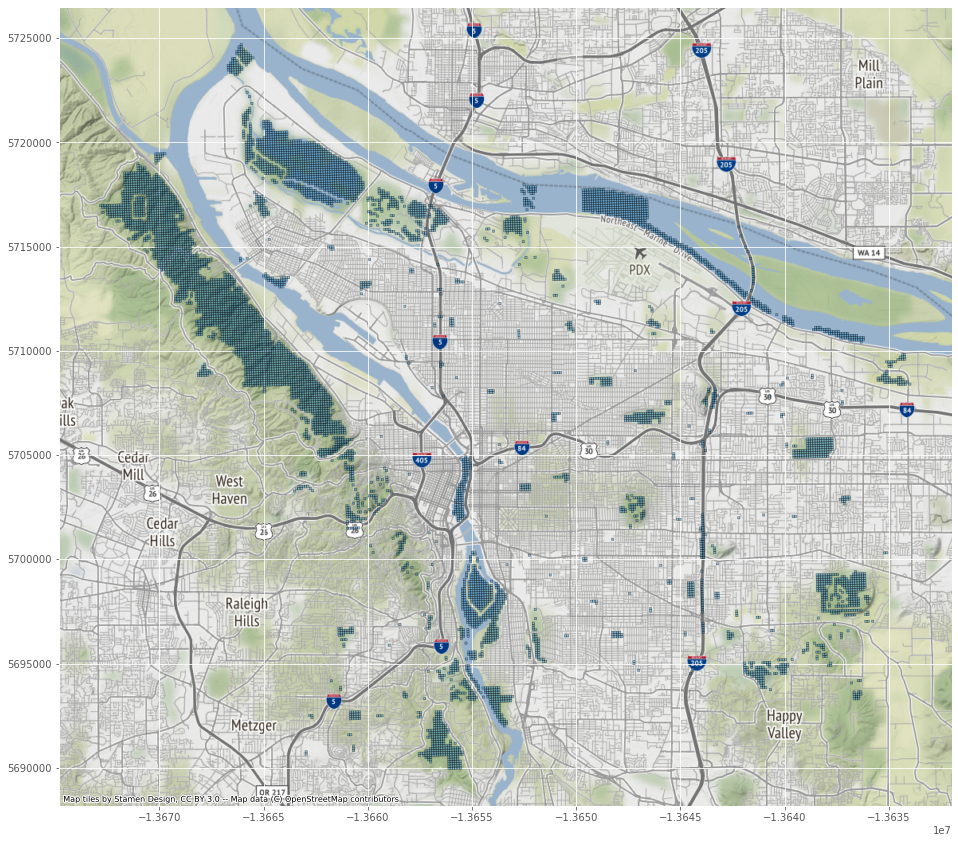

In [10]:
zoning = zoning[zoning.CMP == 'OS']
zoned_mesh = gpd.sjoin(mesh, zoning, how='inner', op='within')
ax = zoned_mesh.plot(alpha=0.5, edgecolor='k')
ctx.add_basemap(ax)

Putting both dataframes together we can arrive at a final set of squares to keep for creating a voronoi tessellation.

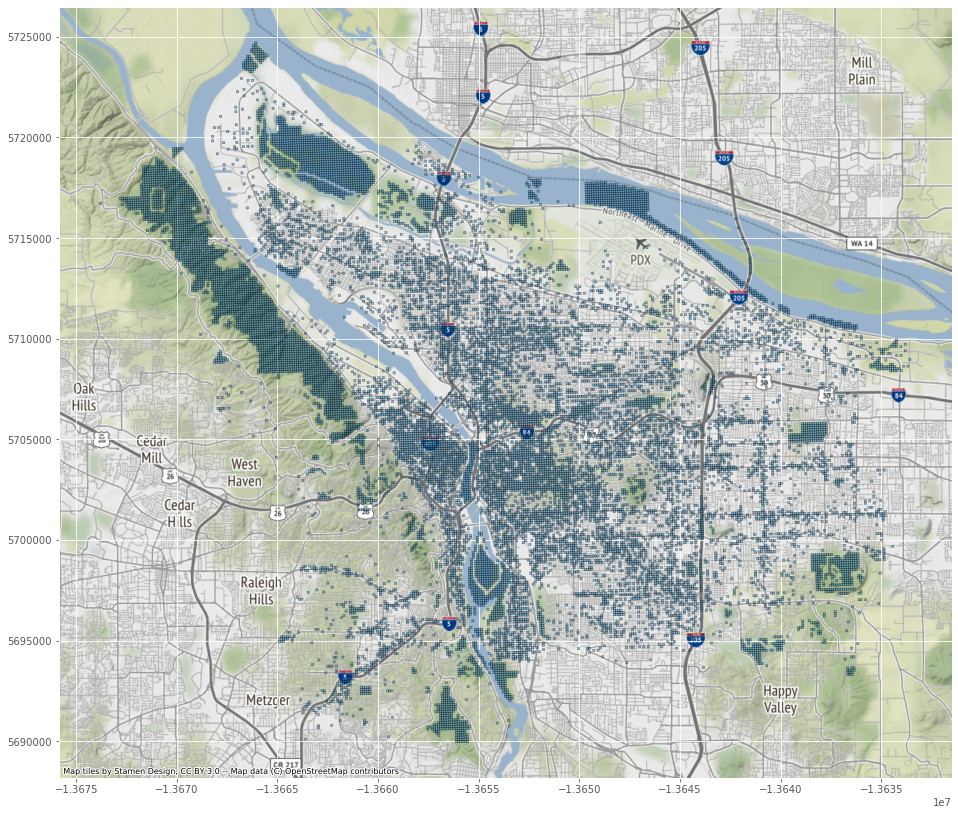

In [11]:
result = pd.concat([keep, zoned_mesh], sort=True)
result = result[~result.index.duplicated(keep='first')]
result = result[['geometry']]
ax = result.plot(alpha=0.5, edgecolor='k')
ctx.add_basemap(ax)

In [12]:
# Save out for analysis with other tools people might want to use
result.to_file('../.data/mesh.geojson', driver='GeoJSON')
result.to_file('../.data/mesh/', driver='ESRI Shapefile')

## Creating voronoi cells from the resulting mesh
Now that we have a set of squares to start from, we'll need to create a tessellation from them so that we can join points to them spatially.  To start we need to convert each square to its centroid point and create an ND array from that.

In [13]:
coord_array = []
result[['geometry']].centroid.map(lambda x: coord_array.append([x.x, x.y]))
coord_array = np.array(coord_array)

Now we can use the Voronoi classes from scipy to create a Voronoi tessellation from the centroid points

In [14]:
from scipy.spatial import Voronoi, voronoi_plot_2d
vor = Voronoi(coord_array)

Now we can take a quick look at the resulting tessellation...

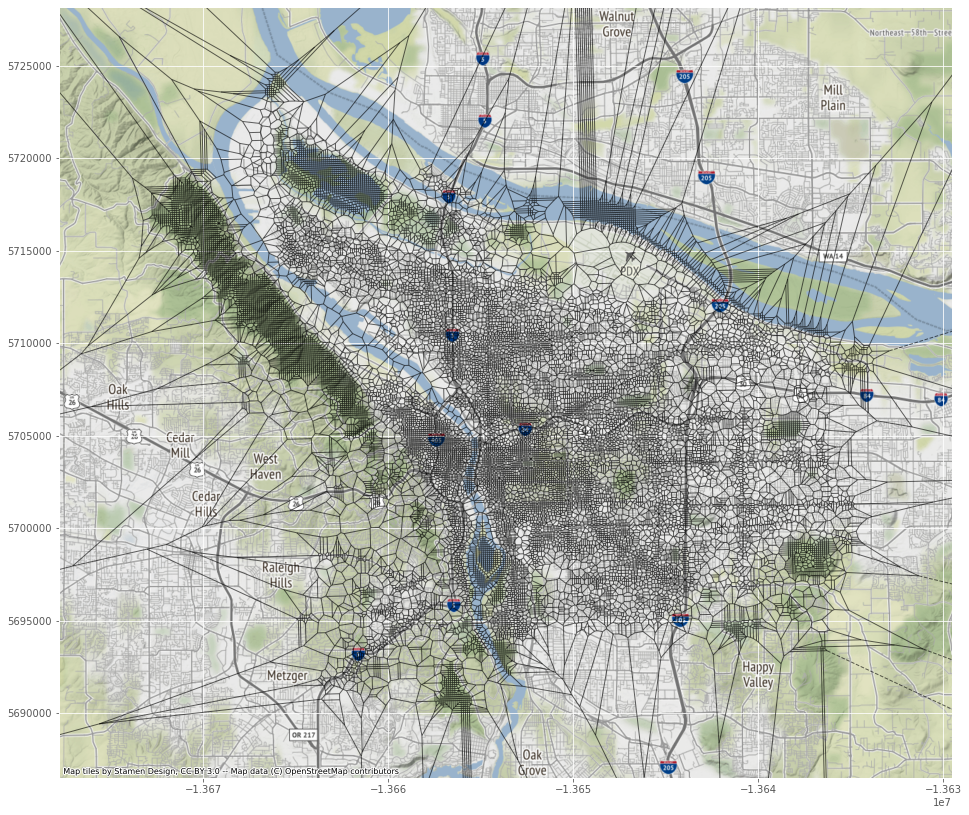

In [15]:
fig = voronoi_plot_2d(vor, show_vertices=False, line_colors='k',
                line_width=1, line_alpha=0.6, point_size=0)
ctx.add_basemap(fig.gca())

This represents a rather large area, but we can definitely see that there are areas of high and low density and that they change as they move away from major streets and into more residential areas.  We also need to deal with the characteristics of Voronoi tessellations and bound these by the city itself.  One thing to note is that there are very few infinite segments in this dataset to account for, which will be extremely helpful.

The following code creates some segments from the Voronoi cells, borrowed straight from the `voronoi_plot_2d` method used above to draw the cells.

In [16]:
finite_segments = []
infinite_segments = []

center = vor.points.mean(axis=0)
ptp_bound = vor.points.ptp(axis=0)

for pointidx, simplex in zip(vor.ridge_points, vor.ridge_vertices):
    simplex = np.asarray(simplex)
    if np.all(simplex >= 0):
        finite_segments.append(vor.vertices[simplex])
    else:
        i = simplex[simplex >= 0][0]  # finite end Voronoi vertex

        t = vor.points[pointidx[1]] - vor.points[pointidx[0]]  # tangent
        t /= np.linalg.norm(t)
        n = np.array([-t[1], t[0]])  # normal

        midpoint = vor.points[pointidx].mean(axis=0)
        direction = np.sign(np.dot(midpoint - center, n)) * n
        if (vor.furthest_site):
            direction = -direction
        far_point = vor.vertices[i] + direction * ptp_bound.max()

        infinite_segments.append([vor.vertices[i], far_point])

We'll convert those finite segments into polygons and give them an identifier based on their shape.

In [17]:
cells = gpd.GeoDataFrame(
    { 'geometry': gpd.GeoSeries([p for p in shapely.ops.polygonize(finite_segments)]) }
)
cells['hash'] = cells.geometry.map(lambda x: hashlib.md5(shapely.wkt.dumps(x).encode('utf-8')))

Now we need to bound the polygon dataset by Portland itself.

In [18]:
cities = gpd.read_file('../.data/cities.geojson')
cities = cities.to_crs('epsg:3857')
portland = cities[cities.CITYNAME == 'Portland']
portland['geometry'] = portland.geometry.map(lambda x: x.convex_hull)

/opt/conda/lib/python3.7/site-packages/ipykernel_launcher.py:4: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  after removing the cwd from sys.path.


In [19]:
cells = gpd.overlay(
    cells,
    portland,
    how='intersection'
)[['hash', 'geometry']]

/opt/conda/lib/python3.7/site-packages/geopandas/base.py:48: UserWarning: GeoSeries crs mismatch: None and epsg:3857
  warn("GeoSeries crs mismatch: {0} and {1}".format(this.crs, other.crs))
